### Using Yolo

In [1]:
!pip install ultralytics

In [ ]:
model = YOLO('yolov8n.pt')

### write a region

In [4]:
import cv2
from google.colab.patches import cv2_imshow


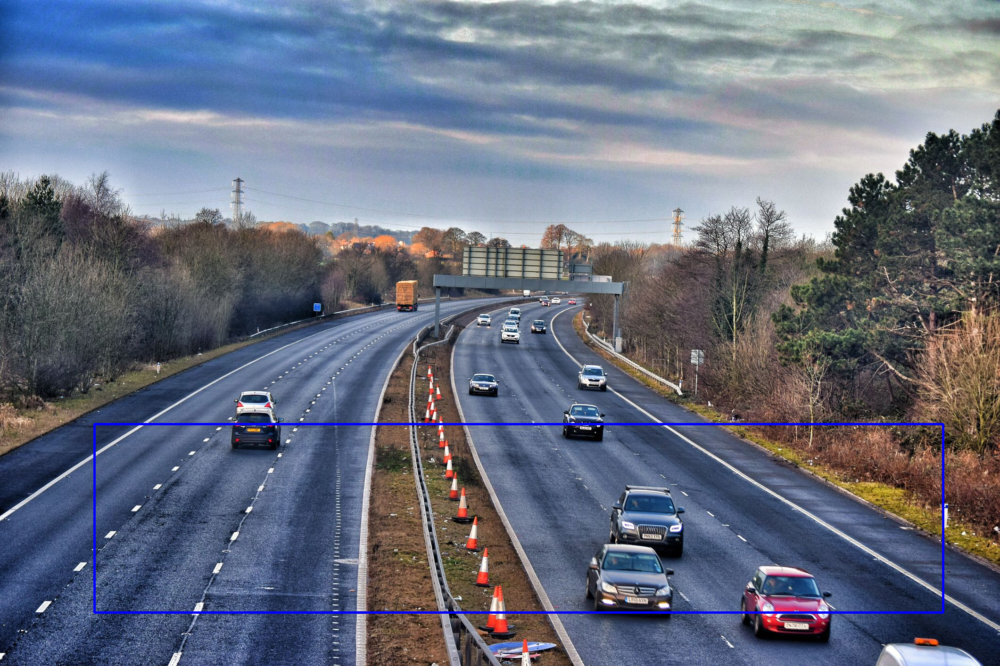

In [3]:

x, y, w, h = 200, 900, 1800, 400
img = cv2.imread('/content/car.jpg')
img = cv2.rectangle(img, (x,y), (x+ w, y +h), (255,0,0), 4)
cv2_imshow(img)

### Detect with a image, same with video


0: 448x640 9 cars, 6.7ms
Speed: 2.5ms preprocess, 6.7ms inference, 1.2ms postprocess per image at shape (1, 3, 448, 640)


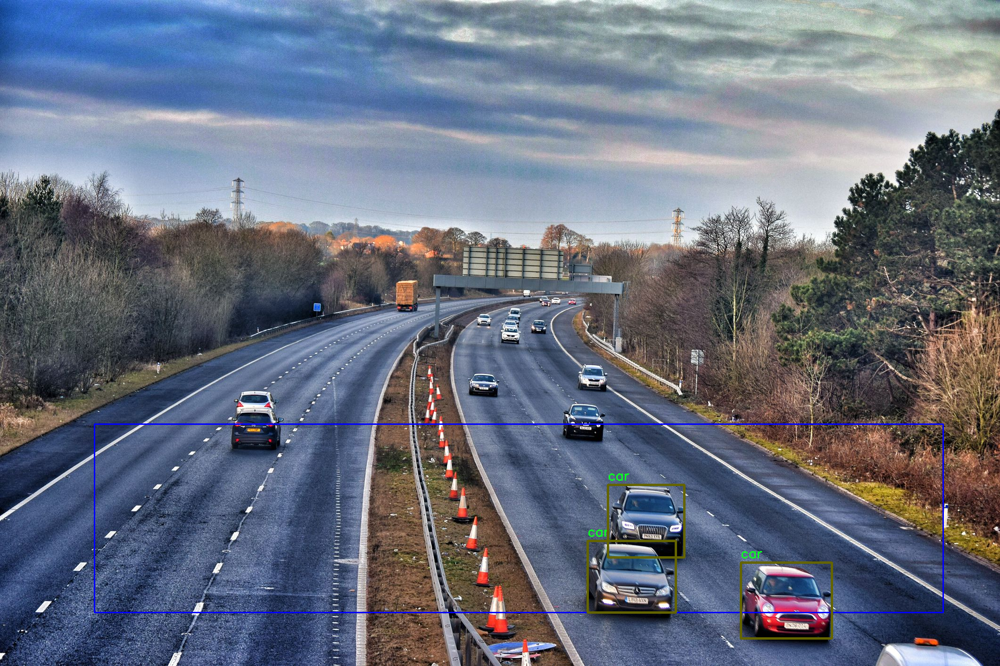

In [5]:
from ultralytics import YOLO
import cv2
import numpy as np

pts = np.array([[200, 900], [200 + 1800, 900], [200 + 1800, 400 + 900], [200, 400 + 900]], np.int32)
pts = pts.reshape((-1, 1, 2))
isClosed = True
color = (255, 0, 0)
thickness = 2

model = YOLO('yolov8n.pt')
name = model.names

img = cv2.imread('/content/car.jpg')

# Using cv2.polylines() method to draw a Blue polygon
img = cv2.polylines(img, [pts], isClosed, color, thickness)

results = model.predict(img)

# Define a function to check if a point is inside the polygon
def is_point_inside_polygon(pt, polygon):
    return cv2.pointPolygonTest(polygon, (int(pt[0]), int(pt[1])), False) >= 0

# Iterate over the results and draw bounding boxes only if they are inside the polygon
for r in results:
    boxes = r.boxes
    for box in boxes:
        b = box.xyxy[0]  # get box coordinates in (left, top, right, bottom) format
        c = box.cls

        # Check if the center of the box is inside the polygon
        center_x = (b[0] + b[2]) / 2
        center_y = (b[1] + b[3]) / 2

        if is_point_inside_polygon((center_x, center_y), pts):
            img = cv2.rectangle(img, (int(b[0]), int(b[1])), (int(b[2]), int(b[3])), (0, 100, 100), 3)
            cv2.putText(img, name[int(c)], (int(b[0]), int(b[1]) - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (36, 255, 12), 2)

# Display the result
cv2_imshow( img)


You can put more point to pts list to have your poligon

Detect with Video

In [ ]:
from ultralytics import YOLO
import cv2
import numpy as np

pts = np.array([[200, 900], [200 + 1800, 900], [200 + 1800, 400 + 900], [200, 400 + 900]], np.int32)
pts = pts.reshape((-1, 1, 2))
isClosed = True
color = (255, 0, 0)
thickness = 2

model = YOLO('yolov8n.pt')
name = model.names

# Open a video capture object
cap = cv2.VideoCapture('your_video_path.mp4')  # Replace 'your_video_path.mp4' with your video file

while cap.isOpened():
    ret, frame = cap.read()
    if not ret:
        break

    # Using cv2.polylines() method to draw a Blue polygon
    frame = cv2.polylines(frame, [pts], isClosed, color, thickness)

    results = model.predict(frame)

    # Iterate over the results and draw bounding boxes only if they are inside the polygon
    for r in results:
        boxes = r.boxes
        for box in boxes:
            b = box.xyxy[0]  # get box coordinates in (left, top, right, bottom) format
            c = box.cls

            # Check if the center of the box is inside the polygon
            center_x = (b[0] + b[2]) / 2
            center_y = (b[1] + b[3]) / 2

            if is_point_inside_polygon((center_x, center_y), pts):
                frame = cv2.rectangle(frame, (int(b[0]), int(b[1])), (int(b[2]), int(b[3])), (0, 100, 100), 3)
                cv2.putText(frame, name[int(c)], (int(b[0]), int(b[1]) - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (36, 255, 12), 2)

    # Display the result
    cv2.imshow('Video Detection', frame)

    if cv2.waitKey(1) & 0xFF == ord('q'):
        break

cap.release()
cv2.destroyAllWindows()
